In [1]:
function _arrayscatter(x,y,shape=Circle(.5,.5,.04),axiscolor=:lightblue,debug=false, grid=Grid(4), custom="")
   topx = maximum(x)
    topy = maximum(y)
    axisx = Line([(-1,-1), (-1,1), (1,1)],axiscolor)
   axisx_tag = axisx.update([(-1,-1), (-1,1), (1,1)])
    axisy = Line([(0,0), (0,1), (0,1)],axiscolor)
    axisy_tag = axisy.update([(0,0), (0,1), (0,1)])
    grid_tag = grid.update()
    fullcustom = ""
    if custom != ""
        [custom = string(fullcustom, i) for i in custom]
    end
    expression = string("compose(context(),")
    # Coordinate parsing -------
    for (i, w) in zip(x, y)
        inputx = i / topx
        inputy = w / topy
        exp = shape.update(inputx,inputy)
        expression = string(expression,string(exp))
    end
    expression = string(expression, "(context(),", axisx_tag,grid_tag,custom, axisy_tag,"),")
    expression = Meta.parse(string(expression,")"))
    if debug == true println(expression) end
    composition = eval(expression)
    show() = composition
    tree() = introspect(composition)
    save(name) = draw(SVG(name), composition);
    (var)->(show;composition;tree;save)
end

_arrayscatter (generic function with 6 methods)

In [2]:
function Circle(x,y,diameter,fillin=:orange,stroke=:black)
    composition = compose(context(), circle(x,y,diameter), fill(string(fillin)))
    color = string("\"",string(fillin),"\"")
    stroke = string("\"",string(stroke),"\"")
    tag = string("circle(",string(x),",",string(y),',',diameter,"), fill(", color , "),")
    tree() = introspect(composition)
    show() = composition
    x = x
    y = y
    save(name) = draw(SVG(name), composition);
    update(x,y) =  string("circle(",string(x),",",string(y),',',diameter,"), fill(", color ,"), stroke(",stroke, "),")
    (var)->(show;composition;tree;tag;x;y;update;diameter;save)
end
function Line(pairs, color=:black, width=2)
    tree() = introspect(composition)
    show() = composition
    composition = compose(context(), line(pairs), stroke(string(color)))
    color = string("\"",string(color),"\"")
    pairstring = ""
    for i in pairs
        s = string(i) * ","
        pairstring = pairstring * s
    end
    update(pairs) = string("line([",string(join(pairstring)),"]), stroke(", color, "), linewidth(",width,"mm),")
    (var)->(show;composition;tree;update;color;pairs;save)
end

Line (generic function with 3 methods)

In [3]:
using Compose
function Grid(divisions,colorx=:lightblue,colory=:lightblue,thickness=.3)
    division_amount = 1 / divisions
    total = 0
    Xexpression = "(context(), "
    while total < 1
        total = total + division_amount
        linedraw = Line([(0,total),(1,total)],:lightblue,thickness)
        exp = linedraw.update(:This_symbol_means_nothing)
        Xexpression = string(Xexpression,string(exp))
    end
    Xexpression = string(Xexpression, "),")
    total = 0
    Yexpression = "(context(),"
    while total < 1
        total = total + division_amount
        linedraw = Line([(total,0),(total,1)],:lightblue,thickness)
        exp = linedraw.update(:hi)
        Yexpression = string(Yexpression,string(exp))
    end
    composexp = string(string(Xexpression), string(Yexpression),"),")
    vv = Meta.parse(string("compose(context(),",composexp,")"))
    composition = eval(vv)
    save(name) = draw(SVG(name), composition);
    update() = string(composexp)
    show() = composition
    (var)->(update;composexp;show;save)
end

Grid (generic function with 4 methods)

In [4]:
h = Grid(4)

#21 (generic function with 1 method)

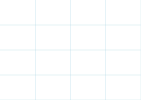

In [5]:
h.show()

In [7]:
shape = Circle(.5,.5,.01,:orange)

#10 (generic function with 1 method)

In [6]:
x = randn(100)
y = randn(100)

100-element Array{Float64,1}:
  0.7551573132937146  
  1.0886574642471192  
 -0.5166117198527489  
 -0.29644266503834704 
 -0.8553795655836955  
  0.03988512994379026 
 -0.557894821171151   
 -0.13847576979396506 
  0.6395161887222606  
 -0.16168407894077977 
  0.798445579839876   
 -0.5438597441897037  
 -0.6753275778049799  
  ⋮                   
  0.9493121262295425  
 -0.34517400981929247 
  0.273184375705697   
 -0.55345617688406    
 -0.2583652108742212  
 -1.1147832600593375  
 -0.6633200315670755  
 -0.127801200028124   
  0.002323351142014512
  0.503050876218826   
 -1.1587636530129015  
 -0.7480931190907837  

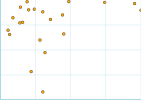

In [9]:
plot = _arrayscatter(x,y,shape)
plot.show()

In [194]:
plot.show()

UndefVarError: UndefVarError: plot not defined

In [68]:
plot.save("example.svg")

false

In [13]:
function _dfscatter(x,y,shape,debug=false,grid=Grid(4),axiscolor=:lightblue)
    topy = maximum(x[y])
    axisx = Line([(-1,-1), (-1,1), (1,1)],axiscolor)
   axisx_tag = axisx.update([(-1,-1), (-1,1), (1,1)])
    axisy = Line([(0,0), (0,1), (0,1)],axiscolor)
    axisy_tag = axisy.update([(0,0), (0,1), (0,1)])
    grid_tag = grid.update()
    expression = string("compose(context()", ", (context(), ", axisx_tag, grid_tag, axisy_tag,"),")
    # Coordinate parsing -------
    y = x[y]
    counter = 0
    for col in eachcol(x, false)
        counter = counter + 1
        topx = maximum(col)
       if col !=  y
            for (i, w) in zip(col, y)
                current_shape = shape[counter]
                inputx = i / topx
                inputy = w / topy
                exp = current_shape.update(inputx,inputy)
                expression = string(expression,"(context(), ", string(exp),"),")
            end
        end
    end
    expression = Meta.parse(string(expression,")"))
    if debug == true println(expression) end
    composition = eval(expression)
    save(name) = draw(SVG(name), composition);
    show() = composition
    tree() = introspect(composition)
    (var)->(show;composition;tree;save)
end

_dfscatter (generic function with 4 methods)

In [14]:
using DataFrames
df = DataFrame(:A => randn(1200), :B => randn(1200), :M => randn(1200), :P => randn(1200), :D => randn(1200), :Y => randn(1200))

,A,B,M,P,D,Y
,Float64,Float64,Float64,Float64,Float64,Float64
1,-0.245729,1.14289,0.920553,0.217622,-1.54758,-0.994989
2,-0.928531,2.15897,1.60609,-0.016695,0.447974,0.202015
3,-0.240356,-0.822105,0.314634,-0.194202,1.39148,1.39305
4,0.104834,0.185291,-1.39832,0.533686,-0.192175,-0.835141
5,0.0277876,-0.248799,-0.691434,0.0572076,-1.5769,-2.20807
6,-0.172353,0.384979,0.331026,-1.08346,0.124459,0.956689
7,1.26139,1.39473,0.410614,0.826641,0.137263,1.14635
8,1.45894,-0.390873,0.856785,-1.00813,-1.61103,2.19567
9,-2.10835,-1.78377,0.0335806,-0.677869,1.37662,0.488057


In [15]:
shapes = [Circle(.5,.5,.01),Circle(.5,.5,.01,:green),Circle(.5,.5,.01,:blue),
        Circle(.5,.5,.01,:pink), Circle(.5,.5,.01,:lightblue)]

5-element Array{getfield(Main, Symbol("##9#13")){Float64,Context,String,getfield(Main, Symbol("#tree#10")){Context},getfield(Main, Symbol("#show#11")){Context},getfield(Main, Symbol("#update#12")){Float64,String}},1}:
 getfield(Main, Symbol("##9#13")){Float64,Context,String,getfield(Main, Symbol("#tree#10")){Context},getfield(Main, Symbol("#show#11")){Context},getfield(Main, Symbol("#update#12")){Float64,String}}(Core.Box(0.5), Core.Box(0.5), 0.01, Context(Measures.BoundingBox{Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}},Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}}}((0.0w, 0.0h), (1.0w, 1.0h)), nothing, nothing, nothing, nothing, List([]), List([Compose.Form{Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Float64},Measures.Length{:cy,Float64}},Measures.Length{:cx,Float64}}}(Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Float64},Measures.Length{:cy,Float64}},Measures.Length{:cx,Float64}}[Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Float64}

In [16]:
@time sot = _dfscatter(df,:Y,shapes,false,Grid(4))

┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = _dfscatter(::DataFrame, ::Symbol, ::Array{getfield(Main, Symbol("##9#13")){Float64,Context,String,getfield(Main, Symbol("#tree#10")){Context},getfield(Main, Symbol("#show#11")){Context},getfield(Main, Symbol("#update#12")){Float64,String}},1}, ::Bool, ::Function, ::Symbol) at In[13]:2
└ @ Main ./In[13]:2
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = _dfscatter(::DataFrame, ::Symbol, ::Array{getfield(Main, Symbol("##9#13")){Float64,Context,String,getfield(Main, Symbol("#tree#10")){Context},getfield(Main, Symbol("#show#11")){Context},getfield(Main, Symbol("#update#12")){Float64,String}},1}, ::Bool, ::Function, ::Symbol) at In[13]:10
└ @ Main ./In[13]:10


  4.995454 seconds (4.11 M allocations: 2.279 GiB, 15.37% gc time)


#23 (generic function with 1 method)

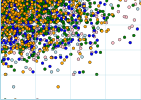

In [17]:
sot.show()

In [18]:
@time using Plots

  7.403954 seconds (11.14 M allocations: 629.168 MiB, 3.37% gc time)


┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = top-level scope at util.jl:156
└ @ Core util.jl:156
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = top-level scope at util.jl:156
└ @ Core util.jl:156
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = top-level scope at util.jl:156
└ @ Core util.jl:156
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = top-level scope at util.jl:156
└ @ Core util.jl:156
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = top-level scope at util.jl:156
└ @ Core util.jl:156
┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = top-level scope at util.jl:156
└ @ Cor

  7.477649 seconds (16.91 M allocations: 854.716 MiB, 6.52% gc time)


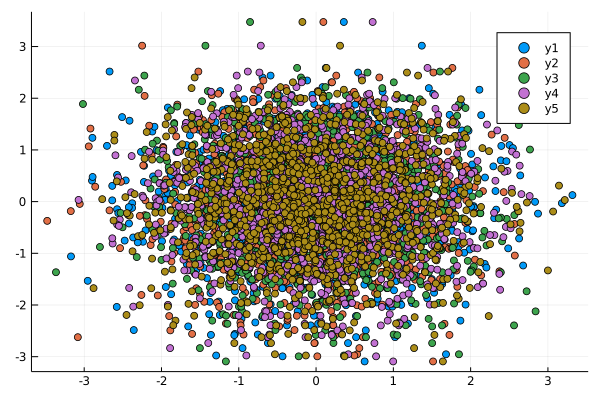

In [19]:
@time scatter([df[:A],df[:B],df[:M],df[:P],df[:D]],df[:Y])

#### 

In [10]:
function Frame(width,height,m_left,m_right,m_top,m_bottom)
    tag = string("UnitBox(0,0," ,width,",", height, ",",m_left, "", m_right,
    ",",m_top, ",", m_bottom,")")
    add(obj) = tag = string(tag,obj)
    show() = exp = Meta.parse(string("draw(SVG('c'),",tag, "))"));eval(exp)
    save() = draw(SVG(name), eval(tag))
    (var)->(add();show();tag)
end

Frame (generic function with 1 method)

In [31]:
using Compose
h = Frame(1280,720,0,0,0,0)

#33 (generic function with 1 method)

In [32]:
h.add(Circle(.5,.5,.01,:blue))

"UnitBox(0,0,1280,720,00,0,0)#12"

In [33]:
h.show()

:($(Expr(:incomplete, "incomplete: premature end of input")))

In [70]:
j = compose(context(),(context(),UnitBox(0,0,1280,720,0mm,0mm,0mm,0mm)), circle(.5,.5,.01))

MethodError: MethodError: no method matching compose(::Context, ::UnitBox{Int64,Int64,Int64,Int64})
Closest candidates are:
  compose(::Context, ::Any, !Matched::Any, !Matched::Any...) at /home/emmett/.julia/packages/Compose/Opbga/src/container.jl:321
  compose(::Context) at /home/emmett/.julia/packages/Compose/Opbga/src/container.jl:324
  compose(::Context, !Matched::Compose.ComposeNode) at /home/emmett/.julia/packages/Compose/Opbga/src/container.jl:300
  ...

In [177]:
# (context(units=UnitBox(0, 0, 1000, 1000))
using Compose
function Frame(width, height, lm, rm, tm, bm)
    base = string("compose(context(units=UnitBox(0,0,",
    width, ",",
    height, ",",
    lm, ",", rm,",",
    tm, ",", bm,
        ")),")
    objects = []
    composition = nothing
    add(objects) = composition,objects,tag = _frameup(base,objects)
    show() = composition
    tree() = introspect(composition)
    save(name) = draw(SVG(name), composition)
    (var)->(add;show;tag;base;objects;composition;save;tree;width;height)
end
function _frameup(tag,objects)
    for object in objects
       tag = string(tag,"(context(),",object.tag, ")") 
    end
    tag = string(tag,")")
    println(tag)
    exp = Meta.parse(tag)
    composition = eval(exp)
    return(composition,objects,tag)
end

_frameup (generic function with 1 method)

In [178]:
f = Frame(200,200,0mm,0mm,0mm,0mm)

#210 (generic function with 1 method)

In [179]:
f.add(Array([Circle(100,100,.5)]))

compose(context(units=UnitBox(0,0,200,200,0.0mm,0.0mm,0.0mm,0.0mm)),(context(),circle(100,100,0.5), fill("orange"),))


(Context(Measures.BoundingBox{Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}},Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}}}((0.0w, 0.0h), (1.0w, 1.0h)), UnitBox{Int64,Int64,Int64,Int64}(0, 0, 200, 200, 0.0mm, 0.0mm, 0.0mm, 0.0mm), nothing, nothing, nothing, List([Context(Measures.BoundingBox{Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}},Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}}}((0.0w, 0.0h), (1.0w, 1.0h)), nothing, nothing, nothing, nothing, List([]), List([Compose.Form{Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Int64},Measures.Length{:cy,Int64}},Measures.Length{:cx,Float64}}}(Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Int64},Measures.Length{:cy,Int64}},Measures.Length{:cx,Float64}}[Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Int64},Measures.Length{:cy,Int64}},Measures.Length{:cx,Float64}}((100cx, 100cy), 0.5cx)], Symbol(""))]), List([Compose.Property{Compose.FillPrimitive}(Compose.FillPrimitive

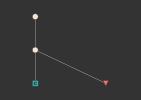

In [180]:
f.tree()

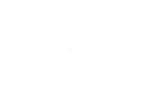

In [181]:
f.show()

In [134]:
comp = compose(context(units=UnitBox(0,0,200,200,0.0mm,0.0mm,0.0mm,0.0mm)), (context(),circle(.5,.5,.5)), (context(),circle(0.5,0.5,"blue"), fill("orange")))

Context(Measures.BoundingBox{Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}},Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}}}((0.0w, 0.0h), (1.0w, 1.0h)), UnitBox{Int64,Int64,Int64,Int64}(0, 0, 200, 200, 0.0mm, 0.0mm, 0.0mm, 0.0mm), nothing, nothing, nothing, List([Context(Measures.BoundingBox{Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}},Tuple{Measures.Length{:w,Float64},Measures.Length{:h,Float64}}}((0.0w, 0.0h), (1.0w, 1.0h)), nothing, nothing, nothing, nothing, List([]), List([Compose.Form{Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Float64},Measures.Length{:cy,Float64}},Measures.Length{:cx,String}}}(Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Float64},Measures.Length{:cy,Float64}},Measures.Length{:cx,String}}[Compose.CirclePrimitive{Tuple{Measures.Length{:cx,Float64},Measures.Length{:cy,Float64}},Measures.Length{:cx,String}}((0.5cx, 0.5cy), bluecx)], Symbol(""))]), List([Compose.Property{Compose.FillPrimitive}(Compose.Fill

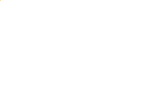

In [98]:
compose(context(units=UnitBox(0,0,200,200,0.0mm,0.0mm,0.0mm,0.0mm)),(context(),circle(0.5,0.5,0.5), fill("orange"),))

In [283]:
function _arrayscatter(x,y,shape=Circle(.5,.5,25),axiscolor=:lightblue,
        debug=false, grid=Grid(4), custom="", frame=Frame(1280,720,20mm,0mm,0mm,20mm))
   topx = maximum(x)
    topy = maximum(y)
    axisx = Line([(-1,-1), (-1,1), (1,1)],axiscolor)
   axisx_tag = axisx.update([(-1,-1), (-1,1), (1,1)])
    axisy = Line([(0,0), (0,1), (0,1)],axiscolor)
    axisy_tag = axisy.update([(0,0), (0,1), (0,1)])
    grid_tag = grid.update()
    ######
    frame_width = frame.width - 20
    frame_height = frame.height - 20
    w_mod = topx / frame_width
    h_mod = topy / frame_height
    ######
    fullcustom = ""
    if custom != ""
        [custom = string(fullcustom, i) for i in custom]
    end
    expression = string("")
    # Coordinate parsing -------
    for (i, w) in zip(x, y)
        inputx = i * w_mod
        inputy = w * h_mod
        exp = shape.update(inputx,inputy)
        expression = string(expression,string(exp))
    end
    expression = string(expression, "(context(),", axisx_tag,grid_tag,custom, axisy_tag,"),")
    tt = transfertype(expression)
    frame.add([tt])
    if debug == true println(expression) end
    composition = eval(expression)
    show() = frame.show()
    tree() = introspect(composition)
    save(name) = draw(SVG(name), composition);
    (var)->(show;composition;tree;save)
end
mutable struct transfertype
   tag 
end

In [284]:
function _calcmultiplier(width,height,topx,topy)
    
end

_calcmultiplier (generic function with 2 methods)

In [285]:
plot = _arrayscatter(x,y,shape)

compose(context(units=UnitBox(0,0,1280,720,20.0mm,0.0mm,0.0mm,20.0mm)),(context(),circle(0.07936507936507936,1.4285714285714286,0.01), fill("orange"), stroke("black"),circle(0.15873015873015872,1.7142857142857142,0.01), fill("orange"), stroke("black"),circle(0.23809523809523808,2.0,0.01), fill("orange"), stroke("black"),circle(0.31746031746031744,2.2857142857142856,0.01), fill("orange"), stroke("black"),(context(),line([(-1, -1),(-1, 1),(1, 1),]), stroke("lightblue"), linewidth(2mm),(context(), line([(0, 0.25),(1, 0.25),]), stroke("lightblue"), linewidth(0.3mm),line([(0, 0.5),(1, 0.5),]), stroke("lightblue"), linewidth(0.3mm),line([(0, 0.75),(1, 0.75),]), stroke("lightblue"), linewidth(0.3mm),line([(0, 1.0),(1, 1.0),]), stroke("lightblue"), linewidth(0.3mm),),(context(),line([(0.25, 0),(0.25, 1),]), stroke("lightblue"), linewidth(0.3mm),line([(0.5, 0),(0.5, 1),]), stroke("lightblue"), linewidth(0.3mm),line([(0.75, 0),(0.75, 1),]), stroke("lightblue"), linewidth(0.3mm),line([(1.0, 0),(1

#390 (generic function with 1 method)

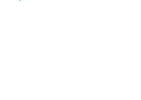

In [286]:
plot.show()

In [274]:
# teenie  tiny plotty
#     haha